<a href="https://colab.research.google.com/github/Maestrelli9/Data-Engineering-MVP/blob/main/MVP_PUC.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ANÁLISE DE DADOS E BOAS PRÁTICAS


---


## A Indústria de Jogos Eletrônicos Está Estagnada?

Escolhi abordar este tema para manter a continuidade da análise realizada no MVP anterior, mas com uma nova perspectiva, considerando como o ano de 2024 está se desenrolando para a indústria ocidental. Observamos que a indústria oriental tem dominado, tornando-se referência na criação de obras originais e de alta qualidade, enquanto a indústria ocidental tem se pautado em remakes, DLCs, remasters e receitas repetitivas.

Para isso, utilizei um novo dataset que contém dados mais recentes, abrangendo informações até 2021. Um dos motivos para a escolha deste dataset foi sua estrutura mais enxuta, com menos colunas, permitindo uma análise mais direta e objetiva e o fato de ter dados bem mais recentes que o anterior que só apresentava informações até 2016.


---



### Hipóteses

1. **Satisfação do Público:** Acredito que o público, de modo geral, está satisfeito e confortável com a atual oferta de jogos. A indústria atingiu um grande limite tecnológico, e não devemos esperar inovações revolucionárias por um bom tempo. Essa situação pode levar as pessoas a se acomodarem e buscarem experiências nostálgicas.

2. **Investimento na Indústria:** A indústria de jogos é uma gigante econômica, movimentando mais dinheiro do que as indústrias do cinema e da música somadas, desde antes da pandemia. Esse interesse atrai mais investidores e pessoas de fora, o que pode transformar o foco da indústria em lucratividade, em detrimento da criatividade e inovação.


---



### Por que o Modelo é Supervisionado?

O modelo utilizado nesta análise é classificado como supervisionado porque trabalha com um conjunto de dados que contém rótulos ou valores de saída conhecidos. Neste caso, estamos analisando as avaliações de críticos e usuários de jogos eletrônicos, onde as notas atribuídas (meta score e user review) funcionam como variáveis-alvo que queremos prever ou analisar.

Escolhi trabalhar com um modelo supervisionado porque ele permite uma análise mais precisa das relações entre as variáveis, além de facilitar a identificação de padrões e tendências. Com dados rotulados, podemos treinar o modelo para fazer previsões sobre como as avaliações futuras podem se comportar, com base em características como a plataforma, o ano de lançamento e outros atributos dos jogos.

Além disso, modelos supervisionados são particularmente úteis quando se busca compreender como diferentes fatores impactam os resultados, possibilitando uma interpretação mais clara e fundamentada das discrepâncias entre as avaliações dos críticos e as dos usuários. Isso enriquece a análise e fornece insights valiosos para o desenvolvimento de jogos na indústria.


# Definição do Problema


---


Este projeto visa analisar um **dataset de videogames**, que contém informações sobre jogos lançados entre 1995 e 2021, incluindo avaliações feitas tanto por críticos profissionais (meta_score) quanto por usuários (user_review). O objetivo é explorar esses dados para identificar padrões e tendências nas avaliações de jogos, entender como essas avaliações se relacionam e preparar o dataset para análises mais detalhadas no futuro.


---


Especificamente, o projeto busca responder a perguntas como:

* **A crítica especializada realmente contribui para o desenvolvimento da indústria de jogos?**
* **A experiência final do usuário é mais influente do que as avaliações críticas na percepção de sucesso de um jogo?**
* **Existe alguma evidência de que a indústria de jogos ocidental possa enfrentar estagnação no futuro?**


---


A partir dessas perguntas, esperamos obter insights sobre a relevância das avaliações críticas e se as preferências dos usuários divergem das dos críticos, além de explorar possíveis implicações para o futuro da indústria de videogames.



# Objetivo


---


O principal objetivo deste projeto é explorar o dataset de videogames para entender as relações entre as avaliações de críticos e de usuários ao longo do tempo. Buscamos identificar padrões nas avaliações e analisar a possível correlação entre essas duas variáveis. Além disso, pretendemos preparar os dados para análises mais aprofundadas no futuro, que possam trazer respostas às perguntas levantadas sobre o impacto das críticas na indústria de jogos, a percepção dos usuários e possíveis tendências de estagnação na indústria ocidental de videogames.


---



In [1]:

import pandas as pd

# URL do arquivo CSV no GitHub (raw link)
url = 'https://raw.githubusercontent.com/Maestrelli9/MVP-Analise-de-Dados/refs/heads/main/all_games.csv'

# Ler o arquivo CSV diretamente do GitHub
df = pd.read_csv(url)

# Converter o DataFrame para JSON
json_data = df.to_json(orient='records')

# Exibir o JSON resultante
print(json_data)

# Se quiser salvar em um arquivo JSON local
with open('dataset.json', 'w') as json_file:
    json_file.write(json_data)


[{"name":"The Legend of Zelda: Ocarina of Time","platform":" Nintendo 64","release_date":"November 23, 1998","summary":"As a young boy, Link is tricked by Ganondorf, the King of the Gerudo Thieves. The evil human uses Link to gain access to the Sacred Realm, where he places his tainted hands on Triforce and transforms the beautiful Hyrulean landscape into a barren wasteland. Link is determined to fix the problems he helped to create, so with the help of Rauru he travels through time gathering the powers of the Seven Sages.","meta_score":99,"user_review":"9.1"},{"name":"Tony Hawk's Pro Skater 2","platform":" PlayStation","release_date":"September 20, 2000","summary":"As most major publishers' development efforts shift to any number of next-generation platforms, Tony Hawk 2 will likely stand as one of the last truly fantastic games to be released on the PlayStation.","meta_score":98,"user_review":"7.4"},{"name":"Grand Theft Auto IV","platform":" PlayStation 3","release_date":"April 29, 2

In [2]:
# Verificar as primeiras linhas
df.head()


,name,platform,release_date,summary,meta_score,user_review
0,The Legend of Zelda: Ocarina of Time,Nintendo 64,"November 23, 1998","As a young boy, Link is tricked by Ganondorf, ...",99,9.1
1,Tony Hawk's Pro Skater 2,PlayStation,"September 20, 2000",As most major publishers' development efforts ...,98,7.4
2,Grand Theft Auto IV,PlayStation 3,"April 29, 2008",[Metacritic's 2008 PS3 Game of the Year; Also ...,98,7.7
3,SoulCalibur,Dreamcast,"September 8, 1999","This is a tale of souls and swords, transcendi...",98,8.4
4,Grand Theft Auto IV,Xbox 360,"April 29, 2008",[Metacritic's 2008 Xbox 360 Game of the Year; ...,98,7.9


In [3]:
# Mostrando as colunas do meu data set e descrevendo-as
df.describe()


,meta_score
count,18800.000000
mean,70.648883
std,12.225006
min,20.000000
25%,64.000000
50%,72.000000
75%,80.000000
max,99.000000


In [4]:
# Verificando o número de Linhas/Colunas
df.shape


(18800, 6)

In [5]:
# Identificando aonde temos células nulas no dataset
df.isnull().sum()


,0
name,0
platform,0
release_date,0
summary,114
meta_score,0
user_review,0


In [6]:
# Início do processo de limpeza dos dados. Verifiquei que não há dados nulos nas colunas 'rating' e 'score', que são essenciais para a análise.
# Após examinar o dataset, identifiquei que, em vez de valores nulos, as colunas apresentam 'tbd' (To be Defined). Assim, iniciei o processo de limpeza.
# Observação: foram identificadas 114 células nulas na coluna 'summary', mas esta coluna será ignorada, pois não é crítica para as análises que estou realizando.
# Substituir "tbd" por NaN nas colunas 'rating' e 'score'
df.replace('tbd', pd.NA, inplace=True)

# Remover as linhas onde 'rating' ou 'score' tem valores faltantes (NaN)
df.dropna(subset=['meta_score', 'user_review'], inplace=True)

# Verificar as primeiras linhas após a remoção
df.head()



,name,platform,release_date,summary,meta_score,user_review
0,The Legend of Zelda: Ocarina of Time,Nintendo 64,"November 23, 1998","As a young boy, Link is tricked by Ganondorf, ...",99,9.1
1,Tony Hawk's Pro Skater 2,PlayStation,"September 20, 2000",As most major publishers' development efforts ...,98,7.4
2,Grand Theft Auto IV,PlayStation 3,"April 29, 2008",[Metacritic's 2008 PS3 Game of the Year; Also ...,98,7.7
3,SoulCalibur,Dreamcast,"September 8, 1999","This is a tale of souls and swords, transcendi...",98,8.4
4,Grand Theft Auto IV,Xbox 360,"April 29, 2008",[Metacritic's 2008 Xbox 360 Game of the Year; ...,98,7.9


In [7]:
df.shape  # Número de linhas e colunas após a limpeza


(17435, 6)

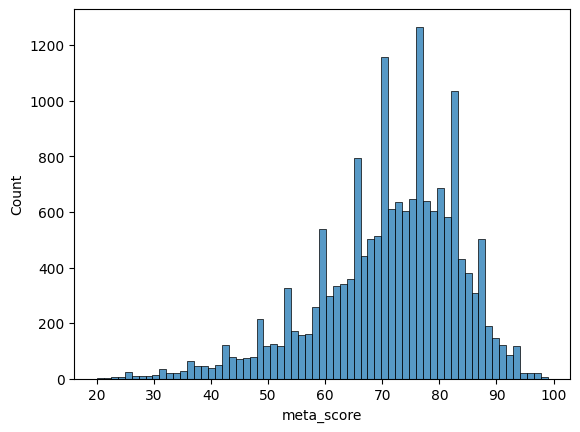

In [8]:
# Fiz um histograma para o atributo do score
import matplotlib.pyplot as plt
import seaborn as sns
sns.histplot(df['meta_score'])  # Histograma de um atributo
plt.show()

Este foi o primeiro histograma que criei após a limpeza dos dados. Embora tenha sido um experimento inicial, ele não forneceu as informações necessárias para responder às perguntas específicas do meu projeto. Essa visualização me ajudou a perceber a importância de direcionar melhor minha análise, permitindo uma reflexão mais profunda sobre o que eu realmente quero observar e quais insights desejo extrair dos dados. A partir desse ponto, comecei a considerar visualizações mais relevantes que pudessem elucidar padrões e tendências significativas nas avaliações dos jogos.

In [9]:
# Esta parte do código foi utilizada porque inicialmente apliquei o método 'get_dummies' na coluna 'meta_score', o que resultou na multiplicação de colunas e na remoção da coluna original.
# df = pd.get_dummies(df, columns=['meta_score'], prefix='meta_score')
# df.head()
# Utilizei o código abaixo para identificar esse erro. Como não consegui corrigir, decidi remover o código que gerou as dummies, já que não fazia mais sentido para as minhas análises e reiniciei a sessão do Colab.
# Verificar os nomes das colunas
print("Colunas no DataFrame:")
print(df.columns)

# Remover espaços em branco nos nomes das colunas
df.columns = df.columns.str.strip()

# Verificar se a coluna 'meta_score' existe
if 'meta_score' in df.columns:
    print("A coluna 'meta_score' foi encontrada:")
    print(df['meta_score'].head())
else:
    print("A coluna 'meta_score' não foi encontrada.")



Colunas no DataFrame:
Index(['name', 'platform', 'release_date', 'summary', 'meta_score',
       'user_review'],
      dtype='object')
A coluna 'meta_score' foi encontrada:
0    99
1    98
2    98
3    98
4    98
Name: meta_score, dtype: int64


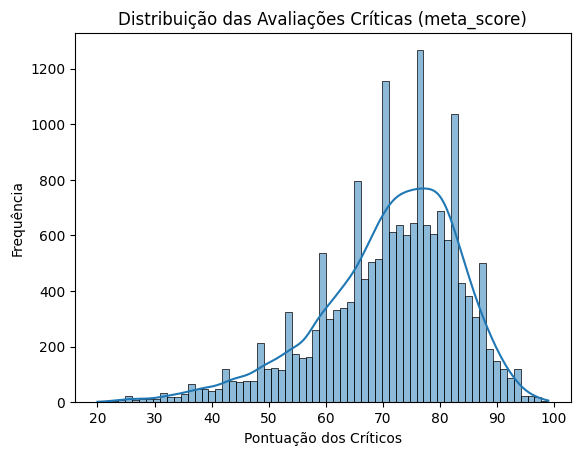

In [10]:
# # Este histograma mostra a distribuição das avaliações críticas (meta_score) dos videogames.
# A frequência indica quantos jogos se enquadram em cada intervalo de pontuação.
# Com essa visualização, esperava-se observar uma discrepância maior nas notas dos críticos; no entanto,
# há um agrupamento significativo de notas "médias" (entre 70 e 80), sugerindo que a maioria dos jogos recebeu avaliações semelhantes.
import matplotlib.pyplot as plt
import seaborn as sns

# Criar um histograma para a coluna 'meta_score'
sns.histplot(df['meta_score'], kde=True)  # Adicionar linha de suavização (KDE)
plt.title('Distribuição das Avaliações Críticas (meta_score)')
plt.xlabel('Pontuação dos Críticos')
plt.ylabel('Frequência')
plt.show()



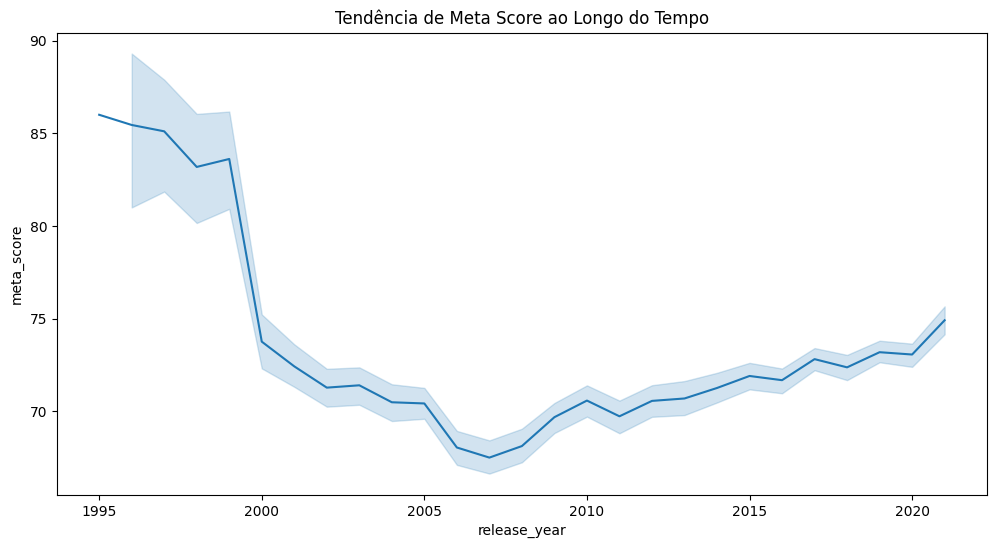

In [11]:
# Após observar uma aglomeração de jogos com nível de qualidade média, procurei entender as possíveis razões para isso.
# Para isso, criei esta visualização que mostra a tendência do meta_score ao longo dos anos.
# A linha representa a média das pontuações críticas para cada ano de lançamento, permitindo analisar como as avaliações mudaram ao longo do tempo.
df['release_year'] = pd.to_datetime(df['release_date']).dt.year
plt.figure(figsize=(12, 6))
sns.lineplot(x='release_year', y='meta_score', data=df, estimator='mean')
plt.title('Tendência de Meta Score ao Longo do Tempo')
plt.show()


Com essas duas últimas visualizações, ficou claro para mim que a inovação e a criatividade influenciam significativamente as avaliações críticas, assim como o surgimento de novas tecnologias, que podem justificar os picos nas notas, mesmo diante do declínio geral da "qualidade" dos jogos. Ao longo dos anos, as "ideias" tendem a se tornar repetitivas, e as narrativas começam a apresentar uma padronização, o que resulta em uma maioria de jogos que mantém um "nível" mínimo, mas reduz a quantidade de títulos que alcançam a excelência.

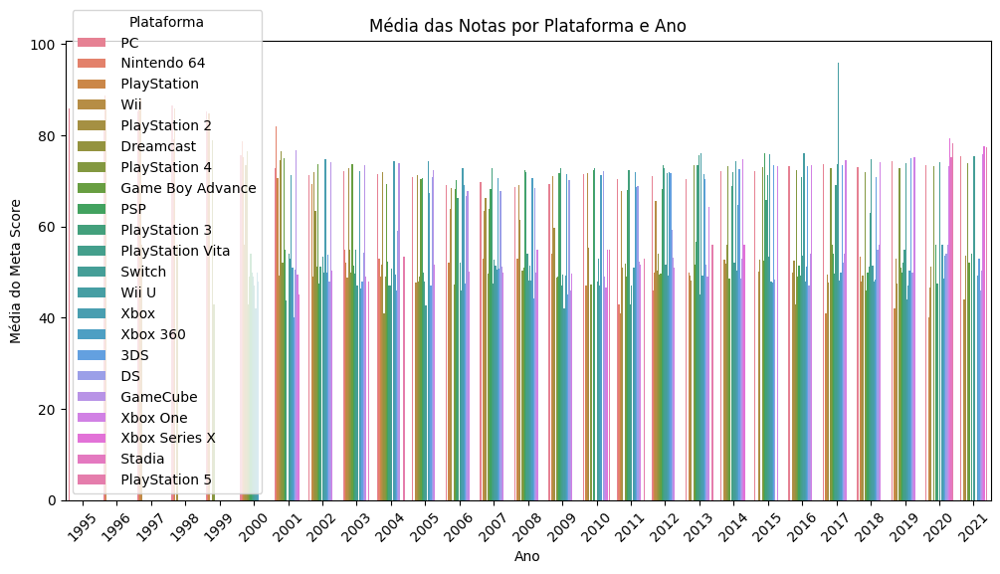

In [12]:
# Busquei então uma visão mais robusta que pudesse detalhar melhor essa discrepância e como as "qualidades" se tornaram padronizadas na indústria,
# resultando em pouquíssimos casos de excelência em um contexto geral, assim como do inverso.
import matplotlib.pyplot as plt
import seaborn as sns

# Supondo que 'release_date' esteja em formato de data
df['release_date'] = pd.to_datetime(df['release_date'])
df['year'] = df['release_date'].dt.year

# Filtrar apenas as colunas necessárias
filtered_df = df[['year', 'platform', 'meta_score']]

# Calcular a média das notas por plataforma e ano
mean_scores = filtered_df.groupby(['year', 'platform'])['meta_score'].mean().reset_index()

# Criar o gráfico de barras
plt.figure(figsize=(12, 6))
sns.barplot(data=mean_scores, x='year', y='meta_score', hue='platform')
plt.title('Média das Notas por Plataforma e Ano')
plt.xlabel('Ano')
plt.ylabel('Média do Meta Score')
plt.legend(title='Plataforma')
plt.xticks(rotation=45)
plt.show()



Divididos em tantas plataformas e jogos diferentes, essa visualização se torna mais rica, permitindo identificar melhor tanto os picos quanto as quedas acentuadas nas avaliações. Com isso, fica mais claro que as plataformas cujas notas médias ficam abaixo da "linha de qualidade", que está em torno de 70, tendem a ser abandonadas por seus fabricantes. Isso reflete como o padrão de qualidade se consolidou na indústria, e como as plataformas que não atingem esse nível acabam perdendo relevância ao longo do tempo.

In [13]:
# Com o surgimento de diversas plataformas e o aumento da competição no mercado de jogos, decidi criar uma visualização que consolidasse
# o número de plataformas, agrupando-as de acordo com as empresas que as desenvolveram. Para isso, primeiro realizei um mapeamento
# que resultou na adição de uma nova coluna chamada 'company', representando cada plataforma por sua respectiva empresa.
# O processo consiste em cinco passos: verificar os valores únicos na coluna 'platform', normalizar esses nomes,
# criar um dicionário de mapeamento, aplicar esse mapeamento e, finalmente, verificar o resultado para garantir que todos
# os dados foram corretamente associados.
# Passo 1: Verificar os valores únicos na coluna 'platform'
print(df['platform'].unique())

# Passo 2: Normalizar os nomes das plataformas
df['platform'] = df['platform'].str.strip().str.lower()

# Verificar os valores únicos novamente após a normalização
print(df['platform'].unique())

# Passo 3: Criar o dicionário de mapeamento
platform_to_company = {
    'pc': 'PC',
    'nintendo 64': 'Nintendo',
    'playstation': 'Sony',
    'wii': 'Nintendo',
    'playstation 2': 'Sony',
    'dreamcast': 'Sega',
    'playstation 4': 'Sony',
    'game boy advance': 'Nintendo',
    'psp': 'Sony',
    'playstation 3': 'Sony',
    'playstation vita': 'Sony',
    'switch': 'Nintendo',
    'wii u': 'Nintendo',
    'xbox': 'Microsoft',
    'xbox 360': 'Microsoft',
    '3ds': 'Nintendo',
    'ds': 'Nintendo',
    'gamecube': 'Nintendo',
    'xbox one': 'Microsoft',
    'xbox series x': 'Microsoft',
    'stadia': 'Google',
    'playstation 5': 'Sony',
}

# Passo 4: Mapeia as plataformas para as empresas
df['company'] = df['platform'].replace(platform_to_company)

# Passo 5: Verificar o resultado
print(df[['platform', 'company']].head())
print(df['company'].isnull().sum())  # Número de plataformas que não foram mapeadas


[' Nintendo 64' ' PlayStation' ' PlayStation 3' ' Dreamcast' ' Xbox 360'
 ' Wii' ' Xbox One' ' PC' ' Switch' ' PlayStation 2' ' PlayStation 4'
 ' GameCube' ' Xbox' ' Wii U' ' Game Boy Advance' ' 3DS' ' Xbox Series X'
 ' DS' ' PlayStation Vita' ' PlayStation 5' ' PSP' ' Stadia']
['nintendo 64' 'playstation' 'playstation 3' 'dreamcast' 'xbox 360' 'wii'
 'xbox one' 'pc' 'switch' 'playstation 2' 'playstation 4' 'gamecube'
 'xbox' 'wii u' 'game boy advance' '3ds' 'xbox series x' 'ds'
 'playstation vita' 'playstation 5' 'psp' 'stadia']
        platform    company
0    nintendo 64   Nintendo
1    playstation       Sony
2  playstation 3       Sony
3      dreamcast       Sega
4       xbox 360  Microsoft
0


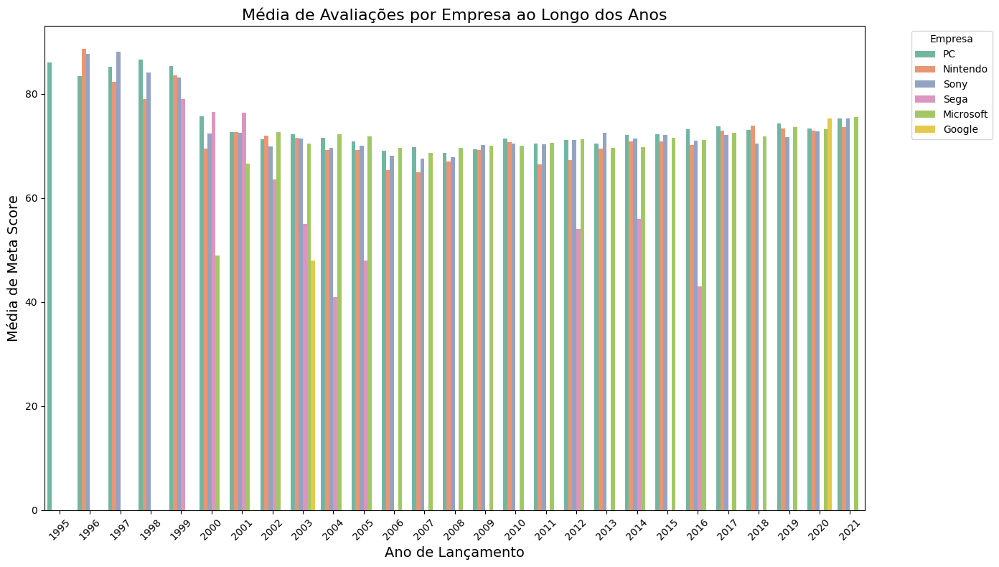

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns

# Extraindo o ano da coluna 'release_date' e criando uma nova coluna 'release_year'
df['release_year'] = pd.to_datetime(df['release_date']).dt.year

# Agrupando os dados por 'release_year' e 'company', e calculando a média do 'meta_score'
average_scores = df.groupby(['release_year', 'company'])['meta_score'].mean().reset_index()

# Criando o gráfico de barras agrupadas
plt.figure(figsize=(14, 8))
sns.barplot(data=average_scores, x='release_year', y='meta_score', hue='company', palette='Set2')

# Configurando o título e os rótulos
plt.title('Média de Avaliações por Empresa ao Longo dos Anos', fontsize=16)
plt.xlabel('Ano de Lançamento', fontsize=14)
plt.ylabel('Média de Meta Score', fontsize=14)
plt.xticks(rotation=45)
plt.legend(title='Empresa', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

# Mostrando o gráfico
plt.show()


Nessa visualização, é possível enxergar de forma mais clara como, ao longo dos anos, as discrepâncias entre as avaliações foram sendo minimizadas, levando a um consenso geral sobre um padrão de qualidade na indústria. Empresas que não conseguiram acompanhar esse nível de qualidade acabaram desaparecendo ou mudando de estratégia, como o caso da Sega, que deixou de fabricar seus próprios consoles em 2001.

In [15]:
# A partir dessa visualização, percebi a necessidade de condensar as avaliações dos críticos e as notas dos usuários
# para entender se há uma real convergência entre elas ou se há discrepâncias significativas.
# O primeiro passo é verificar os valores únicos presentes nas colunas 'user_review' e 'meta_score' para assegurar que as notas estão devidamente representadas.

print(df['user_review'].unique())
print(df['meta_score'].unique())


['9.1' '7.4' '7.7' '8.4' '7.9' '8.0' '8.3' '6.2' '8.7' '7.5' '8.8' '8.5'
 '8.6' '8.9' '8.2' '9.2' '7.8' '9.0' '9.3' '8.1' '6.8' '7.6' '6.9' '6.6'
 '7.3' '7.2' '9.4' '5.7' '6.0' '5.8' '7.1' '3.3' '5.0' '5.5' '6.5' '5.9'
 '6.7' '3.8' '6.4' '7.0' '6.3' '4.9' '5.3' '3.5' '4.7' '6.1' '4.8' '4.1'
 '5.6' '4.4' '5.4' '4.6' '3.1' '5.2' '4.3' '1.8' '4.5' '5.1' '4.2' '4.0'
 '9.7' '3.2' '2.9' '2.1' '2.4' '3.4' '3.0' '3.7' '2.2' '2.6' '2.7' '2.5'
 '2.8' '3.9' '2.0' '9.6' '1.5' '3.6' '1.4' '1.2' '0.9' '1.9' '1.1' '1.7'
 '0.8' '1.0' '0.6' '2.3' '0.5' '1.6' '0.2' '0.7' '1.3']
[99 98 97 96 95 94 93 92 91 90 89 88 87 86 85 84 83 82 81 80 79 78 77 76
 75 74 73 72 71 70 69 68 67 66 65 64 63 62 61 60 59 58 57 56 55 54 53 52
 51 50 49 48 47 46 45 44 43 42 41 40 39 38 37 36 35 34 33 32 31 30 29 28
 27 26 25 24 23 22 21 20]


In [16]:
# Para garantir a precisão das análises, estou convertendo as colunas 'user_review' e 'meta_score' para valores numéricos.
# Qualquer valor não numérico será substituído por NaN, para depois remover as linhas com dados ausentes nessas colunas.
# Isso permitirá um processamento correto nas próximas visualizações e análises.
df['user_review'] = pd.to_numeric(df['user_review'], errors='coerce')
df['meta_score'] = pd.to_numeric(df['meta_score'], errors='coerce')

# Excluindo as linhas que ainda contêm valores ausentes em 'user_review' ou 'meta_score'
df.dropna(subset=['user_review', 'meta_score'], inplace=True)


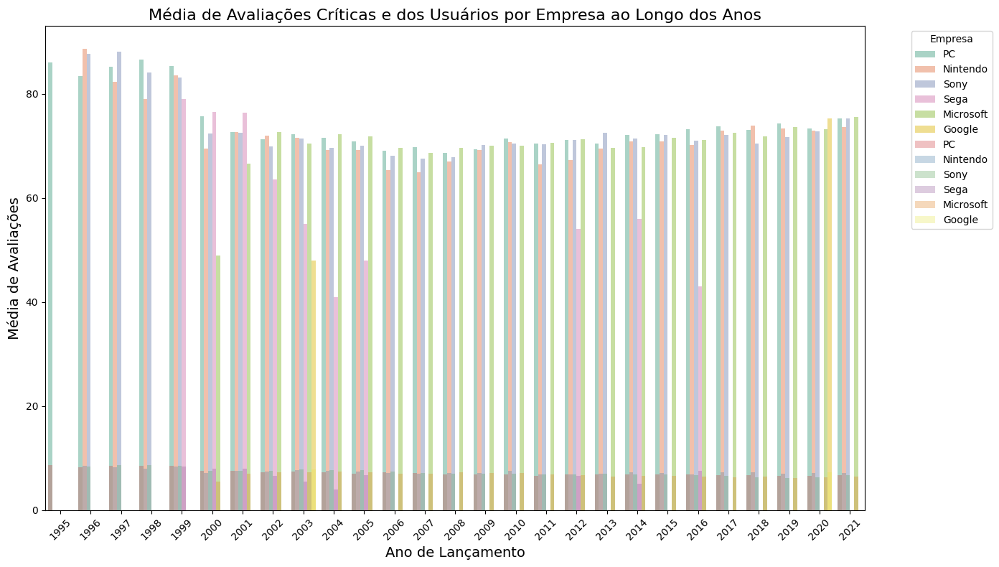

In [17]:
# Extraindo o ano da coluna 'release_date' e criando uma nova coluna 'release_year'
df['release_year'] = pd.to_datetime(df['release_date']).dt.year

# Agrupando os dados por 'release_year' e 'company', e calculando a média do 'meta_score' e 'user_review'
# Isso cria um DataFrame com as médias das notas dos críticos (meta_score) e dos usuários (user_review) para cada ano e empresa
average_scores = df.groupby(['release_year', 'company'])[['meta_score', 'user_review']].mean().reset_index()

# Iniciando a figura do gráfico com o tamanho ajustado
plt.figure(figsize=(14, 8))

# Gráfico de barras para 'meta_score' (média das notas dos críticos), com cores da paleta 'Set2' e opacidade de 60%
sns.barplot(data=average_scores, x='release_year', y='meta_score', hue='company', palette='Set2', alpha=0.6)

# Gráfico de barras para 'user_review' (média das notas dos usuários), usando a mesma base de dados
# Aqui as barras terão uma opacidade de 30% para distinguir melhor as avaliações dos usuários
sns.barplot(data=average_scores, x='release_year', y='user_review', hue='company', palette='Set1', alpha=0.3)

# Configurações do título e dos rótulos dos eixos, ajustando o tamanho da fonte para melhorar a leitura
plt.title('Média de Avaliações Críticas e dos Usuários por Empresa ao Longo dos Anos', fontsize=16)
plt.xlabel('Ano de Lançamento', fontsize=14)
plt.ylabel('Média de Avaliações', fontsize=14)

# Rotacionando os rótulos do eixo x em 45 graus para evitar sobreposição
plt.xticks(rotation=45)

# Adicionando a legenda para distinguir as empresas, e posicionando-a fora da área do gráfico para melhor visualização
plt.legend(title='Empresa', bbox_to_anchor=(1.05, 1), loc='upper left')

# Ajustando o layout para que todos os elementos caibam adequadamente dentro do gráfico
plt.tight_layout()

# Exibindo o gráfico
plt.show()



Aqui cometi o erro de não normalizar as notas para a mesma escala, o que fez com que a visualização ficasse confusa e difícil de interpretar. As notas dos críticos vão de 0 a 100, enquanto as dos usuários estão em uma escala de 0 a 10. Essa discrepância prejudicou o entendimento claro dos dados, já que as notas dos críticos e dos usuários não foram comparadas de forma justa. Para melhorar a visualização, será necessário normalizar ambas as notas para a mesma escala, permitindo uma análise mais clara da diferença ou alinhamento entre as duas avaliações ao longo dos anos.

In [18]:
# Normalizar 'meta_score' e 'user_review' para o intervalo de 0 a 1
df['meta_score_normalized'] = df['meta_score'] / 100  # Normalizando para 0 a 1
df['user_review_normalized'] = df['user_review'] / 10  # Normalizando para 0 a 1

# Agrupando os dados por 'release_year' e 'company', e calculando a média dos valores normalizados
average_scores_normalized = df.groupby(['release_year', 'company'])[['meta_score_normalized', 'user_review_normalized']].mean().reset_index()


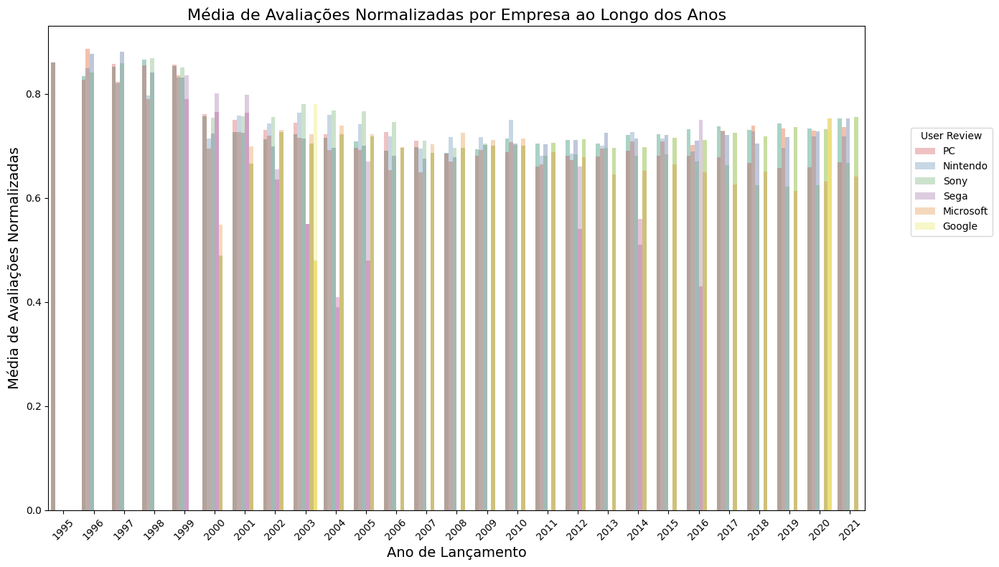

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(14, 8))

# Criando um gráfico de barras para visualizar a média das avaliações normalizadas (meta_score) por empresa ao longo dos anos.
# A coluna 'meta_score_normalized' representa a avaliação feita por críticos, enquanto a coluna 'user_review_normalized' representa a avaliação dos usuários.
sns.barplot(data=average_scores_normalized, x='release_year', y='meta_score_normalized', hue='company', palette='Set2', alpha=0.6)

# Adicionando um gráfico de barras para visualizar a média das avaliações normalizadas dos usuários.
# A transparência do gráfico de usuários é ajustada para permitir que ambas as informações sejam visualizadas juntas.
bar2 = sns.barplot(data=average_scores_normalized, x='release_year', y='user_review_normalized', hue='company', palette='Set1', alpha=0.3)

# Configurando o título e os rótulos do gráfico para melhor interpretação dos dados.
plt.title('Média de Avaliações Normalizadas por Empresa ao Longo dos Anos', fontsize=16)
plt.xlabel('Ano de Lançamento', fontsize=14)
plt.ylabel('Média de Avaliações Normalizadas', fontsize=14)
plt.xticks(rotation=45)

# Ajustando a legenda manualmente para distinguir entre as classificações dos críticos e dos usuários.
handles, labels = bar2.get_legend_handles_labels()
plt.legend(handles[:len(labels)//2], labels[:len(labels)//2], title='Meta Score', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.legend(handles[len(labels)//2:], labels[len(labels)//2:], title='User Review', bbox_to_anchor=(1.05, 0.8), loc='upper left')

plt.tight_layout()

# Mostrando o gráfico final, que compara as avaliações ao longo dos anos.
plt.show()


Aqui, observamos que, de modo geral, os usuários finais têm atribuído notas mais altas aos jogos do que os críticos. Isso reflete uma percepção comum no mercado de jogos: a sensação de que a opinião do jogador tende a ser mais positiva. No entanto, isso levanta uma questão fundamental: para quem a indústria realmente desenvolve seus jogos? Seriam os críticos, que avaliam a qualidade técnica e narrativa, ou os jogadores, que buscam diversão e engajamento? Essa discrepância nas avaliações pode indicar uma desconexão entre a visão dos críticos e a experiência dos jogadores, sugerindo que a indústria deve levar em conta as preferências do público ao criar novos títulos. Mas, ao mesmo tempo, isso levanta outro questionamento: por quanto tempo a indústria pode "relaxar" e manter-se no mesmo nível, lançando jogos pré-prontos, remakes, remasters e reciclando franquias, enquanto entrega pouca inovação e carinho em seus produtos? Essa abordagem pode resultar em uma saturação do mercado, onde os jogadores, eventualmente, buscam experiências mais autênticas e criativas. A questão é até que ponto a indústria pode se apoiar nessa fórmula antes que a falta de inovação comece a afetar a satisfação e o engajamento dos jogadores.

In [20]:
# A partir deste ponto, transformei o problema em uma tarefa de classificação para entender onde os dados realmente se destacam e se podemos afirmar
# que alguma das hipóteses se prova correta ou, pelo menos, faz mais sentido após a análise.
# Para isso, defini uma função de classificação que categoriza os intervalos de notas.

def classify_score(score):
    if score < 0.1:
        return 'Horrível'
    elif score < 0.3:
        return 'Ruim'
    elif score < 0.5:
        return 'Médio'
    elif score < 0.7:
        return 'Bom'
    elif score < 0.9:
        return 'Excelente'
    else:
        return 'Obra Prima'

# Aplicando a classificação para as colunas 'meta_score' e 'user_review'
average_scores_normalized['meta_score_class'] = average_scores_normalized['meta_score_normalized'].apply(classify_score)
average_scores_normalized['user_review_class'] = average_scores_normalized['user_review_normalized'].apply(classify_score)

# Verificando as classificações resultantes
print(average_scores_normalized[['release_year', 'company', 'meta_score_class', 'user_review_class']].head())


   release_year   company meta_score_class user_review_class
0          1995        PC        Excelente         Excelente
1          1996  Nintendo        Excelente         Excelente
2          1996        PC        Excelente         Excelente
3          1996      Sony        Excelente         Excelente
4          1997  Nintendo        Excelente         Excelente


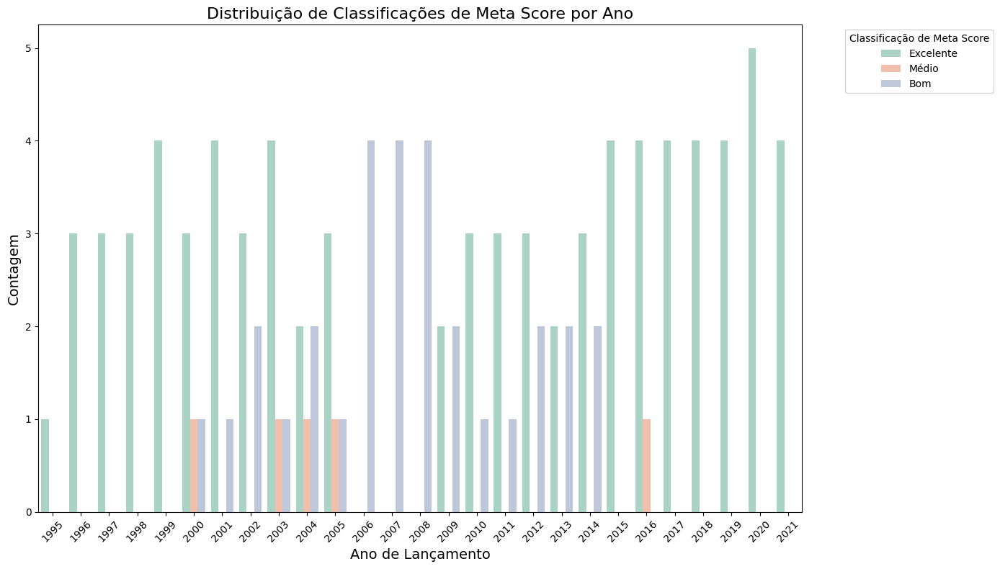

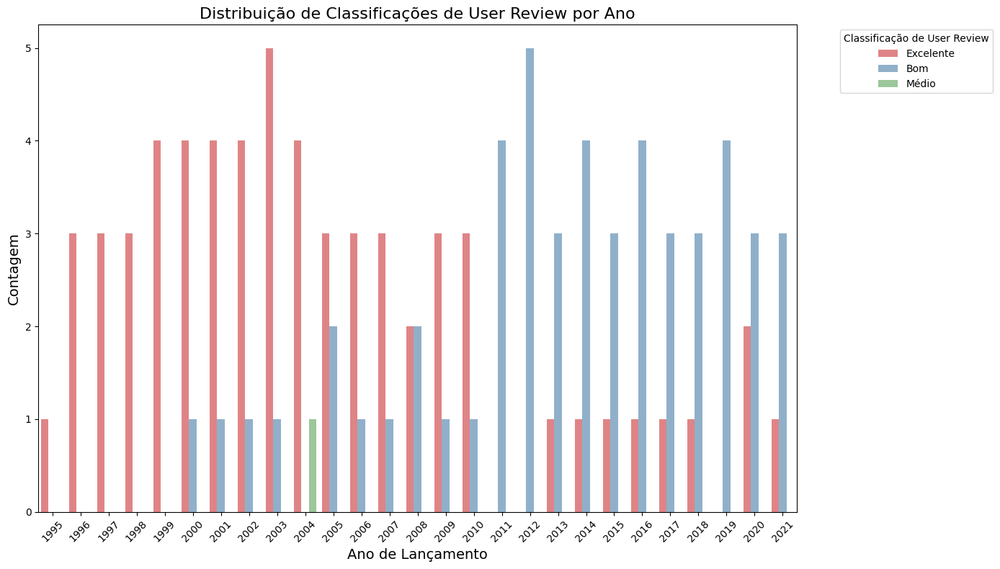

In [21]:
# A seguir, criaremos dois gráficos de contagem para visualizar a distribuição das classificações das notas de 'meta_score' e 'user_review' ao longo dos anos.
# Esses gráficos nos ajudarão a identificar tendências e padrões nas classificações ao longo do tempo.

# Gráfico para 'meta_score_class'
plt.figure(figsize=(14, 8))
sns.countplot(data=average_scores_normalized, x='release_year', hue='meta_score_class', palette='Set2', alpha=0.6)

# Configurando o título e os rótulos
plt.title('Distribuição de Classificações de Meta Score por Ano', fontsize=16)
plt.xlabel('Ano de Lançamento', fontsize=14)
plt.ylabel('Contagem', fontsize=14)
plt.xticks(rotation=45)

plt.legend(title='Classificação de Meta Score', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

# Mostrando o gráfico
plt.show()

# Gráfico para 'user_review_class'
plt.figure(figsize=(14, 8))
sns.countplot(data=average_scores_normalized, x='release_year', hue='user_review_class', palette='Set1', alpha=0.6)

# Configurando o título e os rótulos
plt.title('Distribuição de Classificações de User Review por Ano', fontsize=16)
plt.xlabel('Ano de Lançamento', fontsize=14)
plt.ylabel('Contagem', fontsize=14)
plt.xticks(rotation=45)

plt.legend(title='Classificação de User Review', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

# Mostrando o gráfico
plt.show()


Com esses resultados, fica evidente que, ao longo dos anos, a indústria de jogos eletrônicos tem se acomodado, tornando cada vez mais desafiador produzir obras de excelência. Essa acomodação se deve não apenas ao avanço da tecnologia, que eleva constantemente o padrão mínimo de qualidade esperado, mas também à superprodução que a indústria enfrenta, onde é necessário lançar milhares de jogos anualmente. Essa dinâmica se alinha à hipótese de que investidores externos estão entrando no setor, trazendo capital para essa indústria vibrante e esperam retornos rápidos e crescentes. Assim, a pressão por lucros imediatos pode estar comprometendo a inovação e a qualidade, resultando em jogos que muitas vezes priorizam a quantidade em detrimento da qualidade. Essa situação levanta questões importantes sobre o futuro da indústria e o que realmente significa criar um jogo de qualidade em um mercado tão saturado.

# Checklist para o Projeto de MVP

## 1. Definição do Problema
- [x] **Descrição do Problema**: Está claramente definida e explica a análise das discrepâncias entre as avaliações de críticos e usuários?
- [x] **Tipo de Problema**: Foi identificado como supervisionado ou não supervisionado?
- [x] **Hipóteses**: Foram listadas e justificadas hipóteses relevantes sobre o problema?
  - [x] Hipótese sobre a diferença nas notas entre críticos e usuários.
  - [x] Hipótese sobre a qualidade de jogos com notas baixas.
- [x] **Condições para Seleção dos Dados**: Estão documentadas as condições e critérios usados para selecionar os dados?

## 2. Análise de Dados
- [x] **Estatísticas Descritivas**:
  - [x] Número total de atributos e instâncias documentados.
  - [x] Tipos de dados dos atributos estão claramente identificados.
  - [x] Primeiras linhas do dataset analisadas e comentadas.
  - [x] Identificação e tratamento de valores faltantes, discrepantes ou inconsistentes.
  - [x] Resumo estatístico dos atributos numéricos apresentado.
- [x] **Visualizações**:
  - [x] Distribuição de cada atributo analisada e comentada.
  - [x] Análise gráfica individual e combinada de atributos relevantes.

## 3. Pré-processamento de Dados
- [x] **Operações de Pré-processamento**:
  - [x] As operações realizadas para limpeza e tratamento dos dados estão documentadas.
  - [x] Valores faltantes foram tratados (removidos ou substituídos).
  - [x] Outras transformações necessárias foram realizadas e justificadas.
  - [x] Comparação de insights antes e depois do pré-processamento feita.

## 4. Documentação e Relatório
- [x] **Documentação Consistente**: O notebook contém blocos de texto que explicam cada etapa e decisão de forma clara.
- [x] **Análise de Dados**: Após cada gráfico, um parágrafo resumindo os principais achados e levantando pontos de atenção foi incluído.
- [x] **Código Limpo**: O código está legível, organizado e segue boas práticas de programação.

## 5. Entrega
- [x] **Repositório no GitHub**: Criado um repositório público contendo o notebook e os datasets.
- [x] **Execução sem Erros**: O código foi testado e pode ser executado do início ao fim sem erros.
- [x] **Links**: O link para o repositório foi compartilhado no ambiente de entrega do curso.

## 6. Qualidade do Trabalho
- [x] **Capricho e Qualidade**: O trabalho como um todo está bem apresentado e atende aos requisitos da tarefa.
